# Social Networks

topic: POTUS2020

python=3.7

In [1]:
import pandas as pd
import networkx as nx
import seaborn as sns
import re
import string
from joblib import dump, load
from tldextract import extract
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# show all columns in the DataFrame
pd.set_option('display.max_columns', None)
# fully display the content in displayed table cells
pd.set_option('display.max_colwidth', None)
name_suffix= "[debunking=keywords][lang=en][topic=POTUS2020][platform=Reddit]"

# 1. Construct reply-comment network

### kcore = 1

In [2]:
df = pd.read_csv("/mnt/data/wenlu/rest-redditdata[24.7.19]/POTUS2020/data/debunking_comments[POTUS2020][lang=en].csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 407264 entries, 0 to 407263
Data columns (total 8 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   created_utc   407264 non-null  object
 1   author        407264 non-null  object
 2   subreddit     407264 non-null  object
 3   body          407264 non-null  object
 4   parent_id     407264 non-null  object
 5   subreddit_id  407264 non-null  object
 6   id            407264 non-null  object
 7   lang          407264 non-null  object
dtypes: object(8)
memory usage: 24.9+ MB


In [ ]:
#df['created_utc'] = pd.to_datetime(df['created_utc'])
min_date = df['created_utc'].min()
max_date = df['created_utc'].max()

print("data range:")
print(f"earlist: {min_date}")
print(f"latest: {max_date}")

日期范围:
最早日期: 2020-01-01 08:01:56
最晚日期: 2021-02-01 07:59:01


In [3]:
# for subbmission author mapping
comment_user_list = df[['parent_id']]
comment_user_list['id'] = comment_user_list['parent_id'].str.replace('^t\d+_', '')
comment_user_list.head(5)

,parent_id,id
0,t1_fcom8j2,fcom8j2
1,t3_eiavgo,eiavgo
2,t1_fcon9n0,fcon9n0
3,t1_fcoo2aw,fcoo2aw
4,t3_ei05bb,ei05bb


In [ ]:

first_com = df[df['id'].isin(comment_user_list['id'].to_list())]
first_com.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21903 entries, 0 to 407150
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   created_utc   21903 non-null  object
 1   author        21903 non-null  object
 2   subreddit     21903 non-null  object
 3   body          21903 non-null  object
 4   parent_id     21903 non-null  object
 5   subreddit_id  21903 non-null  object
 6   id            21903 non-null  object
 7   lang          21903 non-null  object
dtypes: object(8)
memory usage: 1.5+ MB


In [ ]:
# submission data
import os
import re
from datetime import datetime

# file path contains all the files of reddit comment data
folder_path = '/mnt/data/shared/shiqian_reddit/data/submission'  
  
# find all the csv files in range
start_date = datetime.strptime("2020-01", "%Y-%m")
end_date = datetime.strptime("2021-01", "%Y-%m")
date_str_pattern = r'submission\[(.*?)\]\.csv'

# empty DataFrame to save all the data
sub_data = pd.DataFrame()  

all_id = set(comment_user_list['id']).union(set(df['id']))
files = os.listdir(folder_path)

for file in files:  
    mtch = re.search(date_str_pattern, file)
    if mtch:
        # get date from file name
        date_str = mtch.group(1)
        file_date = datetime.strptime(date_str, '%Y-%m')
        if start_date <= file_date <= end_date:
            print(file)
            df1 = pd.read_csv(folder_path + '/' + file) 
            df1 = df1[df1['id'].isin(all_id)]   # only keep IDs appeared in comments
            sub_data = sub_data.append(df1, ignore_index=True)  

submission[2020-07].csv
submission[2021-01].csv
submission[2020-10].csv
submission[2020-05].csv
submission[2020-06].csv
submission[2020-11].csv
submission[2020-09].csv
submission[2020-04].csv
submission[2020-12].csv
submission[2020-03].csv
submission[2020-08].csv


In [17]:
sub_data.info() # select the colums you need
sub_data.to_csv("data/submission[topic=POTUS2020][platform=Reddit].csv")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69440 entries, 0 to 69439
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   is_self                 69440 non-null  bool  
 1   author                  69440 non-null  object
 2   archived                69440 non-null  bool  
 3   id                      69440 non-null  object
 4   link_flair_css_class    59855 non-null  object
 5   gilded                  69440 non-null  int64 
 6   over_18                 69440 non-null  bool  
 7   author_flair_css_class  68834 non-null  object
 8   num_comments            69440 non-null  int64 
 9   quarantine              69440 non-null  bool  
 10  edited                  69440 non-null  object
 11  score                   69440 non-null  int64 
 12  stickied                69440 non-null  bool  
 13  url                     69440 non-null  object
 14  secure_media            69440 non-null  object
 15  cr

In [5]:
sub_data = pd.read_csv("data/submission[topic=POTUS2020][platform=Reddit].csv")
sub_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69440 entries, 0 to 69439
Data columns (total 31 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Unnamed: 0              69440 non-null  int64 
 1   is_self                 69440 non-null  bool  
 2   author                  69440 non-null  object
 3   archived                69440 non-null  bool  
 4   id                      69440 non-null  object
 5   link_flair_css_class    59855 non-null  object
 6   gilded                  69440 non-null  int64 
 7   over_18                 69440 non-null  bool  
 8   author_flair_css_class  68834 non-null  object
 9   num_comments            69440 non-null  int64 
 10  quarantine              69440 non-null  bool  
 11  edited                  69440 non-null  object
 12  score                   69440 non-null  int64 
 13  stickied                69440 non-null  bool  
 14  url                     69440 non-null  object
 15  se

In [ ]:
# create a dictionary of {id:author}
sub_id_to_author = dict(zip(sub_data['id'], sub_data['author']))
com_id_to_author = dict(zip(first_com['id'], first_com['author']))
# new dict contained sub_id_to_author and com_id_to_author 
combined_dict = {**sub_id_to_author, **com_id_to_author}
# use .map to map the replyed authors' information
comment_user_list['relpyed_author'] = comment_user_list['id'].map(combined_dict) 

In [7]:
#  map the comment authors' information
comment_id_to_author = dict(zip(df['parent_id'], df['author']))
comment_user_list['comment_author'] = comment_user_list['parent_id'].map(comment_id_to_author) 

In [8]:
comment_user_list_notna = comment_user_list.dropna()
comment_user_list_notna.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 116991 entries, 7 to 407262
Data columns (total 4 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   parent_id       116991 non-null  object
 1   id              116991 non-null  object
 2   relpyed_author  116991 non-null  object
 3   comment_author  116991 non-null  object
dtypes: object(4)
memory usage: 4.5+ MB


In [21]:
name_suffix = "[info=debunk][text=comment][topic=POTUS2020][Reddit]"
comment_user_list_notna.to_csv(f"../R_POTUS2020/data/comment_reply_info{name_suffix}.csv",index= False)

In [9]:
# construct edge list that contains retweet-comment data
rp_list =comment_user_list_notna[comment_user_list_notna['parent_id'].notnull()]
print(len(rp_list))

#author:the account name of the poster
#id:this item's identifier, e.g. "8xwlg"
#parent_id:ID of the thing this comment is a reply to, either the link or a comment in it
# edge list
#edge_list = pd.concat([comment_user_list['parent_id'], all_data['id'], axis=1)

edge_list = pd.DataFrame({  'source':rp_list['comment_author'], 'target':rp_list['relpyed_author']   })

116991


In [10]:
edge_list_notnull = edge_list.dropna(subset=['source'], axis=0)
edge_list_notnull.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 116991 entries, 7 to 407262
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   source  116991 non-null  object
 1   target  116991 non-null  object
dtypes: object(2)
memory usage: 2.7+ MB


In [11]:
edge_list_notnull.to_csv("../Reply/RPnetworks[debunking=keywords][lang=en][topic=POTUS2020][platform=Reddit].csv", index = False)

In [ ]:
 #turn to the the gephi
D = nx.from_pandas_edgelist(edge_list_notnull, create_using=nx.DiGraph)    
nx.write_gexf(D, "data/reply_networks[plat=Reddit][topic=POTUS2020][date8.22].gexf")  

In [ ]:
import networkx as nx
import csv

# read gexf file
G = nx.read_gexf('data/reply_networks[plat=Reddit][topic=POTUS2020][date8.22].gexf')


with open('data/replyusers_info[POTUS2020][platform=Reddit].csv', 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    
    writer.writerow(['Source', 'Target', 'Label'])
    
    
    for source, target, data in G.edges(data=True):
        writer.writerow([source, target, data.get('label', '')])

print("The GEXF data has been successfully converted to a CSV file.") # done


GEXF数据已成功转换为CSV文件


In [4]:
reply_info = pd.read_csv("data/replyusers_info[POTUS2020][platform=Reddit].csv")
reply_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80533 entries, 0 to 80532
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Source  80533 non-null  object 
 1   Target  80533 non-null  object 
 2   Label   0 non-null      float64
dtypes: float64(1), object(2)
memory usage: 1.8+ MB


In [5]:
df_reply = df[df['author'].isin(reply_info['Target'].to_list())]
df_reply.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 219600 entries, 0 to 407262
Data columns (total 8 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   created_utc   219600 non-null  object
 1   author        219600 non-null  object
 2   subreddit     219600 non-null  object
 3   body          219600 non-null  object
 4   parent_id     219600 non-null  object
 5   subreddit_id  219600 non-null  object
 6   id            219600 non-null  object
 7   lang          219600 non-null  object
dtypes: object(8)
memory usage: 15.1+ MB


In [6]:
df_reply.to_csv("data/comment_user[replyedinfo][POTUS2020][Reddit].csv")

In [ ]:
# 
RP_text1 = sub_data[['author','title','selftext']]
RP_text2 = first_com[['author','body']]

In [ ]:
# Check the number of null values in the 'selftext' column in RP_text1
null_selftext_count = RP_text1['selftext'].isnull().sum()
print(f"The number of null values in the 'selftext' column: {null_selftext_count}")

RP_text1['text'] = RP_text1['title'].fillna('') + ' ' + RP_text1['selftext'].fillna('')


RP_text1.head()

'selftext'列中的空值数量: 45136


,author,title,selftext,text
0,u/kdryan1,"Seriously, Jim Banks? You are a total POS...",NaN,"Seriously, Jim Banks? You are a total POS..."
1,u/koany2012,Reddit lefties are cheering on the censorship of far right dipshit Stefan Molyneux the very day they saw the biggest leftist subreddit banned from reddit,"FFS. Censorship/deplatforming isn't left wing, even against far right dipshits. \n\nAnd don't give me that shit about them being a private corporation. Supporting the absolute impunity of private corporations isn't left wing either.","Reddit lefties are cheering on the censorship of far right dipshit Stefan Molyneux the very day they saw the biggest leftist subreddit banned from reddit FFS. Censorship/deplatforming isn't left wing, even against far right dipshits. \n\nAnd don't give me that shit about them being a private corporation. Supporting the absolute impunity of private corporations isn't left wing either."
2,u/christnmusicreleases,Christian Rock &amp; Metal Music Releases Jun 26 2020,NaN,Christian Rock &amp; Metal Music Releases Jun 26 2020
3,u/christnmusicreleases,Christian Rock &amp; Metal Music Releases Jun 26 2020,NaN,Christian Rock &amp; Metal Music Releases Jun 26 2020
4,u/theonehotnews,"Trump: As I watch pandemic spread, I become more and more angry at China",NaN,"Trump: As I watch pandemic spread, I become more and more angry at China"


In [ ]:

RP_text1_subset = RP_text1[['author', 'text']]
RP_text2_subset = RP_text2[['author', 'body']].rename(columns={'body': 'text'})

RP_text = pd.concat([RP_text1_subset, RP_text2_subset], ignore_index=True)

RP_text.head(2)

RP_text.to_csv("data/RP_usser_text[POTUS2020][reddit].csv")

### kcore = 2

In [44]:
# remove the self cycle
D.remove_edges_from(nx.selfloop_edges(D))

# caculate the number of k_core=2
k_core_2 = nx.k_core(D, k=2)

In [45]:
k_core_2.number_of_nodes()
k_core_2.number_of_edges()

18914

In [46]:
in_degrees = dict(k_core_2.in_degree())

# sort the nodes by their degree
sorted_nodes_by_in_degree = sorted(in_degrees, key=in_degrees.get, reverse=True)

In [47]:
for node in sorted_nodes_by_in_degree[:10]:
    print("Node:", node, "In-Degree:", in_degrees[node])

Node: autotldr In-Degree: 175
Node: MTDreams123 In-Degree: 70
Node: AutoModerator In-Degree: 63
Node: NihilistIconoclast In-Degree: 53
Node: Immotile1 In-Degree: 50
Node: PoliticsModeratorBot In-Degree: 44
Node: TheFactualBot In-Degree: 39
Node: TheBigPhilbowski In-Degree: 37
Node: twitterInfo_bot In-Degree: 37
Node: CptGoodnight In-Degree: 35


In [ ]:
nx.write_gexf(k_core_2, "data/reply_networks[core=2][plat=Reddit][topic=POTUS2020].gexf")  

# 2. User texts

### remove HTML and URL


In [ ]:
import html
def simple_text_cleaning(text):
    text = re.sub(r'https?://\S+|www\.\S+', '', text) 
    text = html.unescape(text)  
    text = re.sub(r'<.*?>+', '', text) 
    return text
df_txt = df

In [8]:

from pandarallel import pandarallel
pandarallel.initialize(progress_bar=True, nb_workers=10)
df_txt['text_simply_cleaned'] = df_txt['body'].parallel_apply(simple_text_cleaning)

INFO: Pandarallel will run on 10 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [9]:
df_txt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 407264 entries, 0 to 407263
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   created_utc          407264 non-null  object
 1   author               407264 non-null  object
 2   subreddit            407264 non-null  object
 3   body                 407264 non-null  object
 4   parent_id            407264 non-null  object
 5   subreddit_id         407264 non-null  object
 6   id                   407264 non-null  object
 7   lang                 407264 non-null  object
 8   text_simply_cleaned  407264 non-null  object
dtypes: object(9)
memory usage: 28.0+ MB


In [32]:
user_texts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172910 entries, 0 to 172909
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   author  172910 non-null  object
 1   text    172910 non-null  object
dtypes: object(2)
memory usage: 2.6+ MB


In [ ]:
# Combine each user's own text
user_texts = df_txt.groupby(by='author').agg(text=("text_simply_cleaned", lambda x: ' '.join(set(x)))) #','改为' '
user_texts.reset_index(drop=False, inplace=True)
user_texts.to_csv("data/user_texts[info=debunk][text=comment][topic=POTUS2020].csv", index=False)
user_texts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172910 entries, 0 to 172909
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   author  172910 non-null  object
 1   text    172910 non-null  object
dtypes: object(2)
memory usage: 2.6+ MB


In [ ]:
# set name suffix
name_suffix = "[info=debunk][text=comment][topic=POTUS2020][Reddit]"

In [2]:
user_texts = pd.read_csv("data/user_texts[info=debunk][text=comment][topic=POTUS2020].csv")
user_texts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172910 entries, 0 to 172909
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   author  172910 non-null  object
 1   text    172895 non-null  object
dtypes: object(2)
memory usage: 2.6+ MB


## Perspective

In [ ]:
# user_texts = pd.read_csv(f"data/user_texts{name_suffix}.csv")
texts = pd.DataFrame(user_texts['text'].drop_duplicates())
#texts = texts.rename(columns={'text_simply_cleaned': 'text'})
texts.to_csv(f"data/user_texts_no_duplicates{name_suffix}.csv", index=False)
print(f"number of texts: {len(texts)}") 

number of texts: 172821


In [14]:
texts.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 172821 entries, 0 to 172909
Data columns (total 1 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   text    172821 non-null  object
dtypes: object(1)
memory usage: 2.6+ MB


In [ ]:

TEST1 = pd.read_csv("data/2perspective_api_comment[Reddit]_results[topic=POTUS2020].csv")
TEST1.info()
TEST2 = pd.read_csv("data/3perspective_api_comment[Reddit]_results[topic=POTUS2020].csv")
TEST2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172821 entries, 0 to 172820
Data columns (total 2 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   text                     172820 non-null  object
 1   perspective_api_results  119580 non-null  object
dtypes: object(2)
memory usage: 2.6+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53241 entries, 0 to 53240
Data columns (total 2 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   text                     53241 non-null  object
 1   perspective_api_results  52655 non-null  object
dtypes: object(2)
memory usage: 832.0+ KB


In [ ]:
new_df = TEST1.loc[0:119579].copy()
perspective_res = pd.concat([new_df, TEST2])
perspective_res.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 172821 entries, 0 to 53240
Data columns (total 2 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   text                     172820 non-null  object
 1   perspective_api_results  170829 non-null  object
dtypes: object(2)
memory usage: 4.0+ MB


In [ ]:
'''
perspective_res_path = "data/perspective_api_results[info=debunk][text=comment][topic=COVID19].csv"
perspective_res = pd.read_csv(perspective_res_path)
perspective_res.info()
'''

def get_score_from_json(x):
    if pd.isna(x):
        return None
    s = re.search("'score': {'value': (.+?),", x)
    return float(s.group(1))

perspective_res['toxicity_score'] = perspective_res['perspective_api_results'].apply(get_score_from_json)
perspective_res.to_csv("data/perspective_api_results[info=debunk][Reddit][text=comment][topic=POTUS2020].csv", index=False)

In [19]:
perspective_res.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 172821 entries, 0 to 53240
Data columns (total 3 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   text                     172820 non-null  object 
 1   perspective_api_results  170829 non-null  object 
 2   toxicity_score           170829 non-null  float64
dtypes: float64(1), object(2)
memory usage: 5.3+ MB


## NLTK

In [7]:
import nltk
#nltk.download('vader_lexicon')

from nltk.sentiment import SentimentIntensityAnalyzer
nltk_analyzer = SentimentIntensityAnalyzer()

example = nltk_analyzer.polarity_scores("")
sentiment_names = list(example.keys())
print(sentiment_names)

['neg', 'neu', 'pos', 'compound']


/home/wenlu/anaconda3/envs/reddit/lib/python3.7/site-packages/sklearn/feature_extraction/image.py:167: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype=np.int):
/home/wenlu/anaconda3/envs/reddit/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:30: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more

In [ ]:
from pandarallel import pandarallel
pandarallel.initialize(progress_bar=True, nb_workers=10)

# user_texts.drop(columns=sentiment_names, inplace=True)

result = user_texts['text'].astype(str).parallel_apply(nltk_analyzer.polarity_scores)
result = pd.DataFrame(result.tolist())

user_texts = pd.concat([user_texts, result], axis=1)


In [10]:
user_texts.to_csv(f"data/user_texts{name_suffix}.csv", index=False)
user_texts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172910 entries, 0 to 172909
Data columns (total 6 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   author    172910 non-null  object 
 1   text      172895 non-null  object 
 2   neg       172910 non-null  float64
 3   neu       172910 non-null  float64
 4   pos       172910 non-null  float64
 5   compound  172910 non-null  float64
dtypes: float64(4), object(2)
memory usage: 7.9+ MB


In [3]:
user_texts = pd.read_csv(f"data/user_texts{name_suffix}.csv")
user_texts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172910 entries, 0 to 172909
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   author          172910 non-null  object 
 1   text            172895 non-null  object 
 2   neg             172910 non-null  float64
 3   neu             172910 non-null  float64
 4   pos             172910 non-null  float64
 5   compound        172910 non-null  float64
 6   toxicity_score  170902 non-null  float64
 7   party           55211 non-null   float64
dtypes: float64(6), object(2)
memory usage: 10.6+ MB


# 3.Toxicity-Sentiment Distribution

In [21]:
'''
# adding sentiment scores and toxicity score columns to DataFrame user_texts
user_texts = pd.read_csv("data/user_texts[info=debunk][text=comment][topic=COVID19].csv")
score_dict = load("pkl/user_comment_sentiments_dict[topic=COVID19].pkl")
perspective_res = pd.read_csv("data/perspective_api_results[info=debunk][text=comment][topic=COVID19].csv", 
                              index_col='author')
'''


toxi_dict = perspective_res.set_index('text')['toxicity_score'].to_dict()

user_texts['toxicity_score'] = user_texts['text'].map(toxi_dict)
user_texts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172910 entries, 0 to 172909
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   author          172910 non-null  object 
 1   text            172895 non-null  object 
 2   neg             172910 non-null  float64
 3   neu             172910 non-null  float64
 4   pos             172910 non-null  float64
 5   compound        172910 non-null  float64
 6   toxicity_score  170902 non-null  float64
dtypes: float64(5), object(2)
memory usage: 9.2+ MB


In [27]:
user_texts.to_csv(f"data/user_texts{name_suffix}.csv", index=False)
user_texts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172910 entries, 0 to 172909
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   author          172910 non-null  object 
 1   text            172895 non-null  object 
 2   neg             172910 non-null  float64
 3   neu             172910 non-null  float64
 4   pos             172910 non-null  float64
 5   compound        172910 non-null  float64
 6   toxicity_score  170902 non-null  float64
 7   party           55211 non-null   float64
dtypes: float64(6), object(2)
memory usage: 10.6+ MB


In [2]:
# draw 2D kernel density heatmap
import numpy as np
import plotly.graph_objects as go
from scipy.stats import kde

def toxi_senti_heatmap_2d_ver4(
        data:pd.DataFrame, 
        x='toxicity_score', 
        y='compound',
        xlim=(0, 1), 
        ylim=(-1, 1),
        zlim=(None, None),
        z_scaling=False,
        density_mul_count=True,
        nbins=200
    ):
    '''
    Parameters:
        - data
        - x: a column in data
        - y: another column in data
        - xlim: the range of values for the x-axis
        - ylim: the range of values for the y-axis
        - zlim: the range of values for the z-axis
        - z_scaling: whether to scale the z-axis according to zlim
        - density_mul_count: whether to multiply the probability density (z-axis) by the total number of data points, default is False
        - nbins: grid density.

    Returns: fig, xi, yi, zi
    '''
    data = data[data[x].notna() & data[y].notna()]   # 去除缺失值

    _x = data[x]
    _y = data[y]
    k = kde.gaussian_kde([_x,_y])
    xi, yi = np.mgrid[
            xlim[0]:xlim[1]:nbins*1j, 
            ylim[0]:ylim[1]:nbins*1j
        ]
    zi = k(np.vstack([xi.flatten(), yi.flatten()]))

    if density_mul_count:
        zi = zi * len(data)
    elif z_scaling:
        zi = (zi - zi.min()) * (zlim[1] - zlim[0]) / (zi.max() - zi.min()) + zlim[0]

    fig = go.Figure(data=go.Heatmap(
        x=xi.flatten(),
        y=yi.flatten(),
        z=zi, zmin=zlim[0], zmax=zlim[1],
        colorscale='Turbo',
        colorbar=dict(thickness=25, len=0.75, tickfont=dict(size=11))
    ))

    fig.update_layout(
        autosize=False,
        width=450,
        height=370,
        margin=dict(l=0, r=0, b=45, t=0),
        plot_bgcolor='white',  
        xaxis_showgrid=False,  
        yaxis_showgrid=False,  
    )
    axis_title_size = 16
    axis_tick_size = 12
    fig.update_xaxes(
        title=dict(
                text=x.title() + ' score',
                font=dict(size=axis_title_size),
                standoff=8
            ),
        range=xlim,
        tickfont=dict(size=axis_tick_size), 
        linecolor='black',
        linewidth=0
    )
    fig.update_yaxes(
        title=dict(
                text=y.title() + ' score',
                font=dict(size=axis_title_size),
                standoff=5
            ),
        range=ylim,
        tickfont=dict(size=axis_tick_size), 
        linecolor='black',
        linewidth=0
    )
    return fig, xi, yi, zi

In [ ]:
# draw 3D kernel density heatmap
import numpy as np
import plotly.graph_objects as go
from scipy.stats import gaussian_kde
import plotly.io as pio

def toxi_senti_heatmap_3d_ver4(
        df:pd.DataFrame, 
        x='toxicity_score', 
        y='compound',
        xlim=(0, 1), 
        ylim=(-1, 1),
        zlim=(None, None),
        density_mul_count=True,
        title=None,
        nbins=100
    ):
    
    df = df[df[x].notna() & df[y].notna()]   
    data = np.vstack([df[x].values, df[y].values])

    # gaussian_kde
    kde = gaussian_kde(data)

    xgrid = np.linspace(xlim[0], xlim[1], nbins)
    ygrid = np.linspace(ylim[0], ylim[1], nbins)
    Xgrid, Ygrid = np.meshgrid(xgrid, ygrid)
    Z = kde.evaluate(np.vstack([Xgrid.ravel(), Ygrid.ravel()]))

    Z = Z * len(df) if density_mul_count else Z

    fig = go.Figure(data=[go.Surface(
                x=Xgrid, 
                y=Ygrid, 
                z=Z.reshape(Xgrid.shape), cmin=zlim[0], cmax=zlim[1], 
                colorscale='Turbo', 
                colorbar=dict(thickness=20, len=0.618, tickfont=dict(size=12, weight='bold')))
            ])


    if title:
        fig.update_layout(
                title=dict(x=0.5, y=0.97, font=dict(size=22), text=title, ),
                autosize=False,
               width=450, height=400,
                margin=dict(l=0, r=0, b=0, t=30), 
        )
    else: 
        fig.update_layout(
                autosize=False,
                width=450, height=370,
                margin=dict(l=0, r=0, b=0, t=0), 
        )
    axis_title_size = 14
    axis_tick_size = 11
    fig.update_scenes(
        xaxis=dict(
            title=dict(
                text='Toxicity score',
                font=dict(size=axis_title_size, weight="bold"),
            ), 
            tickfont=dict(size=axis_tick_size, weight="bold"), 
            nticks=6,
            showgrid = False
        ),
        yaxis=dict(
            title=dict(
                text='Compound score',
                font=dict(size=axis_title_size, weight="bold"),
            ), 
            tickfont=dict(size=axis_tick_size, weight="bold"), 
            nticks=6,
            showgrid = False
        ),
        zaxis=dict(
            title=dict(
                text='Kernel density',
                font=dict(size=axis_title_size, weight="bold"),
            ), 
            tickfont=dict(size=axis_tick_size, weight="bold"), 
            nticks=6,
            range=[zlim[0], zlim[1]],
            showgrid = False
        ),
        camera=dict(
            center=dict(x=0, y=0.20, z=0.02),
            eye=dict(x=-12, y=8, z=7),
            projection=dict(type="orthographic"),
        ),
        aspectratio=dict(x=1.28, y=1.28, z=1.28),
    )
    
    return fig, (Z.min(), Z.max())

In [ ]:
def isCloseToHighDensity(
        row, 
        high_density_coords, 
        x='toxicity_score',
        y='compound',
        xlim=(0, 1),
        ylim=(-1, 1),
        nbins=200
    ):
    '''
    - row
    - high_density_coords: The specified high-density point on the grid
    - nbins: Heatmap grid width
    '''
    threshold = dict(x = (xlim[1]-xlim[0]) / (nbins-1) / 2, y = (ylim[1]-ylim[0]) / (nbins-1) / 2)

    close_to_high_density = high_density_coords[
        (
            (high_density_coords['x'] - threshold['x'] <= row[x]) &
            (row[x] <= high_density_coords['x'] + threshold['x'])
        ) &
        (
            (high_density_coords['y'] - threshold['y'] <= row[y]) &
            (row[y] <= high_density_coords['y'] + threshold['y'])
        )
    ]
    return not(close_to_high_density.empty)

def findHighDensityPoints(
        data: pd.DataFrame,
        density_dist: dict,
        x='toxicity_score',
        y='compound',
        xlim=(0, 1),
        ylim=(-1, 1),
        threshold = 0.8,
        nbins=200,
        progress_bar=False,
        nb_workers=20
    ):
    # Find all indexes with z-values greater than the threshold
    indices = np.where(density_dist['z'] > threshold)

    # Use these indexes to get the corresponding x and y coordinates
    high_density_x_coords = density_dist['x'].flatten()[indices]
    high_density_y_coords = density_dist['y'].flatten()[indices]

    
    high_density_coords = dict(x=[], y=[])
    for _x, _y in zip(high_density_x_coords, high_density_y_coords):
        high_density_coords['x'].append(_x)
        high_density_coords['y'].append(_y)

    high_density_coords = pd.DataFrame(high_density_coords)

    
    from pandarallel import pandarallel
    pandarallel.initialize(progress_bar=progress_bar, nb_workers=nb_workers)

    high_density_points = data[data.parallel_apply(isCloseToHighDensity, 
                                                    args=(
                                                            high_density_coords, 
                                                            x, y,
                                                            xlim, ylim,
                                                            nbins
                                                        ), 
                                                    axis=1)]
    print(f"The number of high-density points: {len(high_density_points)}", end=', ')
    print(f"Percentage of users in this category:{100 * len(high_density_points) / len(data)}")

    return high_density_points

## 3.1Users

In [8]:
test = pd.read_csv("../R_POTUS2020/data/user_texts[party][POTUS2020][reddit][8.30].csv")
test.info()
user_texts = test.drop(columns= 'party')
user_texts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172895 entries, 0 to 172894
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   author          172895 non-null  object 
 1   text            172895 non-null  object 
 2   neg             172895 non-null  float64
 3   neu             172895 non-null  float64
 4   pos             172895 non-null  float64
 5   compound        172895 non-null  float64
 6   toxicity_score  170902 non-null  float64
 7   party           55208 non-null   float64
 8   classification  172895 non-null  int64  
 9   probabilities   172895 non-null  object 
dtypes: float64(6), int64(1), object(3)
memory usage: 13.2+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172895 entries, 0 to 172894
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   author          172895 non-null  object 
 1   text            17289

In [3]:

user_texts = pd.read_csv("../R_POTUS2020/data/user_texts[party][POTUS2020][reddit][8.30].csv")
print(f"number of all users: {len(user_texts)}")

D2 = nx.read_gexf(f"data/reply_networks[core=2][plat=Reddit][topic=POTUS2020].gexf")
nodes_2core = nx.get_node_attributes(D2, 'label')


user_texts_2core = user_texts[user_texts['author'].isin(nodes_2core)]
print(f"number of 2-core users: {len(user_texts_2core)}", 
      f"({100 * len(user_texts_2core) / len(user_texts)}%)")

user_texts_no_2core = user_texts[ ~ user_texts['author'].isin(nodes_2core)]
print(f"number of non-2-core users: {len(user_texts_no_2core)}", 
      f"({100 * len(user_texts_no_2core) / len(user_texts)}%)")

number of all users: 172895
number of 2-core users: 8390 (4.852656236444084%)
number of non-2-core users: 164505 (95.14734376355591%)


In [4]:
# Analysis of retweet behavior within and between groups.

df_rp = pd.read_csv(f"/mnt/data/wenlu/rest-redditdata[24.7.19]/R_POTUS2020/data/comment_reply_info[info=debunk][text=comment][topic=POTUS2020][Reddit].csv")
#df_rp = comment_user_list_notna
print(f"number of all retweets: {len(df_rp)}")

users_2core = set(user_texts_2core["author"])
users_non_2core = set(user_texts_no_2core["author"])


# Between groups: The replier and the replied belong to the 2-core and 1-degree, respectively.
num_inter_reply1  = len(df_rp[
    df_rp['comment_author'].isin(users_non_2core) &
    df_rp['relpyed_author'].isin(users_2core)
])
num_inter_reply2  = len(df_rp[
    df_rp['comment_author'].isin(users_2core) &
    df_rp['relpyed_author'].isin(users_non_2core)
])
num_inter_reply = num_inter_reply1 + num_inter_reply2


num_inner_reply1 = len(df_rp[
    df_rp['comment_author'].isin(users_non_2core) &
    df_rp['relpyed_author'].isin(users_non_2core)
])

num_inner_reply2 = len(df_rp[
    df_rp['comment_author'].isin(users_2core) &
    df_rp['relpyed_author'].isin(users_2core)
])

a = num_inter_reply + num_inner_reply1 + num_inner_reply2

print(f"Number of retweets between groups: 2-core retweeting 1-degree.: {num_inter_reply2}", 
      f"({100 * num_inter_reply2 / a}%)")

print(f"Number of retweets between groups: 1-degree retweeting 2-core.: {num_inter_reply1}", 
      f"({100 * num_inter_reply1 / a}%)")

print(f"Number of retweets within the group of 1-degree users.: {num_inner_reply1}",
    f"({100 * num_inner_reply1 / a}%)")
print(f"Number of retweets within the group of 2-core users.: {num_inner_reply2}",
      f"({100 * num_inner_reply2/ a}%)")

number of all retweets: 116991
number of retweets of 组间:2 core转推1 degree: 2216 (9.524218850732797%)
number of retweets of 组间:1 degree转推2 core: 2256 (9.696136158507757%)
number of retweets of 1-degree组内users: 10051 (43.19852151115314%)
number of retweets of 2-core组内users: 8744 (37.58112347960631%)


In [11]:
user_texts['core_status'] = user_texts['author'].apply(lambda x: '2 core' if x in nodes_2core else '1 degree')
user_texts2 = user_texts[['author', 'core_status','classification']]
user_texts2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172895 entries, 0 to 172894
Data columns (total 3 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   author          172895 non-null  object
 1   core_status     172895 non-null  object
 2   classification  172895 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 4.0+ MB


In [20]:

#user_texts2['party'] = user_texts2['classification'].replace({0: 'Democrats', 2: 'Republicans'})
#user_texts2.drop(columns='classification', inplace= True)
user_texts2.info()
user_texts2.to_csv(f"/mnt/data/Sentiment_results/wenlu/user_kcore_party_info/user[core_info][party_info]{name_suffix}.csv", index = False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172895 entries, 0 to 172894
Data columns (total 3 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   author       172895 non-null  object
 1   core_status  172895 non-null  object
 2   party        172895 non-null  object
dtypes: object(3)
memory usage: 4.0+ MB


In [3]:

df_POTUS2020 = pd.read_csv("../R_POTUS2020/data/V2_user_texts[debunking=keywords][lang=en][topic=POTUS2020][platform=Reddit][9.3].csv")
df_POTUS2020.info()
#df_POTUS2020.to_csv(f"/mnt/data/Sentiment_results/wenlu/Subdivide_sentiment/Reddit/user[pessimism]{name_suffix}.csv", index= False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 171447 entries, 0 to 171446
Data columns (total 20 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   text                     171447 non-null  object 
 1   perspective_api_results  170829 non-null  object 
 2   toxicity_score           170829 non-null  float64
 3   author                   171447 non-null  object 
 4   neg                      171447 non-null  float64
 5   neu                      171447 non-null  float64
 6   pos                      171447 non-null  float64
 7   compound                 171447 non-null  float64
 8   sentiment                171447 non-null  object 
 9   anger                    171447 non-null  float64
 10  anticipation             171447 non-null  float64
 11  disgust                  171447 non-null  float64
 12  fear                     171447 non-null  float64
 13  joy                      171447 non-null  float64
 14  love

In [4]:
pessi_dict = df_POTUS2020.set_index('author')['pessimism'].to_dict()
user_texts['pessimism'] = user_texts['author'].map(pessi_dict)
user_texts_2core['pessimism'] = user_texts_2core['author'].map(pessi_dict)
user_texts_no_2core['pessimism'] = user_texts_no_2core['author'].map(pessi_dict)

## 3.2 Plot

In [ ]:
# all users
fig, zlim_3d = toxi_senti_heatmap_3d_ver4(user_texts)
fig.show()
'''
# save pics
pio.write_image(
    fig, 
    f'pic/2heatmap[dim=3][xy=compound&toxicity]{name_suffix}.png', 
    scale=5
)
'''

"\n# 保存为图片文件\npio.write_image(\n    fig, \n    f'pic/2heatmap[dim=3][xy=compound&toxicity]{name_suffix}.png', \n    scale=5\n)\n"

In [ ]:
# 2core users
fig, _ = toxi_senti_heatmap_3d_ver4(user_texts_2core, zlim=zlim_3d)
fig.show()

pio.write_image(
    fig, 
    f'../3Dpics/Reddit/2heatmap[dim=3][core=2][xy=compound&toxicity]{name_suffix}.png', 
    scale=5
)


In [24]:
fig, _ = toxi_senti_heatmap_3d_ver4(user_texts_no_2core, zlim=zlim_3d)
fig.show()

pio.write_image(
    fig, 
    f'../3Dpics/Reddit/2heatmap[dim=3][core=no_2core][xy=compound&toxicity]{name_suffix}.png', 
    scale=5
)

## 3.3 Significant difference detection

In [ ]:
from scipy.stats import mannwhitneyu
def Mann_Whitney_U_test(srs1:pd.Series, srs2:pd.Series):
    '''Utest'''
    u_statistic, p_value = mannwhitneyu(srs1, srs2, alternative='less')
    if p_value < 0.05:
        print(f"U: {u_statistic}, P: {p_value}", end=', ')
        print('The former is significantly smaller overall than the latter.')
        return
    
    u_statistic, p_value = mannwhitneyu(srs1, srs2, alternative='greater')
    if p_value < 0.05:
        print(f"U: {u_statistic}, P: {p_value}", end=', ')
        print('The former is significantly larger than the latter overall.')
        return
    
    u_statistic, p_value = mannwhitneyu(srs1, srs2, alternative='two-sided')
    print(f"U: {u_statistic}, P: {p_value}", end=', ')
    if p_value < 0.05:
        print('There were significant differences between the two sets of data.')
    else:
        print('There were no significant differences between the two sets of data.')


from scipy.stats import ttest_ind
def t_test(srs1:pd.Series, srs2:pd.Series):
    '''T'''
    t_statistic, p_value = ttest_ind(srs1, srs2)
    print(f"T: {t_statistic}, P: {p_value}", end=', ')
    if p_value < 0.05:
        if t_statistic > 0:
            print('The average value of the former is significantly larger than that of the latter.')
        else:
            print('The average value of the former is significantly smaller than that of the latter.')
    else:
        print('There were no significant differences between the two sets of data.')

In [ ]:
_all = user_texts[user_texts['toxicity_score'].notna() & user_texts['compound'].notna()]
_2core = user_texts_2core[user_texts_2core['toxicity_score'].notna() & user_texts_2core['compound'].notna()]
_non_2core = user_texts_no_2core[user_texts_no_2core['toxicity_score'].notna() & user_texts_no_2core['compound'].notna()]


data1 = _all.loc[:, ['toxicity_score','compound','pessimism']]
data2 = _2core.loc[:, ['toxicity_score','compound','pessimism']]
data3 = _non_2core.loc[:, ['toxicity_score','compound','pessimism']]

In [ ]:
print("Toxicity:")
print("all vs 2-core: ", end='\t\t')
Mann_Whitney_U_test(data1['toxicity_score'], data2['toxicity_score'])
print("all vs non-2-core: ", end='\t')
Mann_Whitney_U_test(data1['toxicity_score'], data3['toxicity_score'])
print("2-core vs non-2-core: ", end='\t')
Mann_Whitney_U_test(data2['toxicity_score'], data3['toxicity_score'])

print()

print("Pessimism:")
print("all vs 2-core: ", end='\t\t')
Mann_Whitney_U_test(data1['compound'], data2['compound'])
print("all vs non-2-core: ", end='\t')
Mann_Whitney_U_test(data1['compound'], data3['compound'])
print("2-core vs non-2-core: ", end='\t')
Mann_Whitney_U_test(data2['compound'], data3['compound'])

毒性：
all vs 2-core: 		U统计量: 541221039.5, P值: 8.655162621802713e-63, 前者整体显著比后者小。
all vs non-2-core: 	U统计量: 14062525762.5, P值: 0.005448441851820332, 前者整体显著比后者大。
2-core vs non-2-core: 	U统计量: 657786914.5, P值: 4.254605739227102e-68, 前者整体显著比后者大。

情感：
all vs 2-core: 		U统计量: 812254144.5, P值: 0.0, 前者整体显著比后者大。
all vs non-2-core: 	U统计量: 13791492657.5, P值: 4.1385199003156247e-13, 前者整体显著比后者小。
2-core vs non-2-core: 	U统计量: 386753809.5, P值: 0.0, 前者整体显著比后者小。


In [ ]:
data1 = data1[data1['pessimism'].notna()]
data2 = data2[data2['pessimism'].notna()]
data3 = data3[data3['pessimism'].notna()]

print("Pessimism:")
print("all vs 2-core: ", end='\t\t')
Mann_Whitney_U_test(data1['pessimism'], data2['pessimism'])
print("all vs non-2-core: ", end='\t')
Mann_Whitney_U_test(data1['pessimism'], data3['pessimism'])
print("2-core vs non-2-core: ", end='\t')
Mann_Whitney_U_test(data2['pessimism'], data3['pessimism'])

悲观情绪：
all vs 2-core: 		U统计量: 629430226.0, P值: 2.3346938729419704e-05, 前者整体显著比后者大。
all vs non-2-core: 	U统计量: 13961843394.5, P值: 0.5342731802831047, 两组数据之间没有显著差异。
2-core vs non-2-core: 	U统计量: 569054610.0, P值: 1.0875174320498291e-05, 前者整体显著比后者小。


## 3.4 User polarity

Text(0.5, 9.444444444444459, 'Toxicity score')

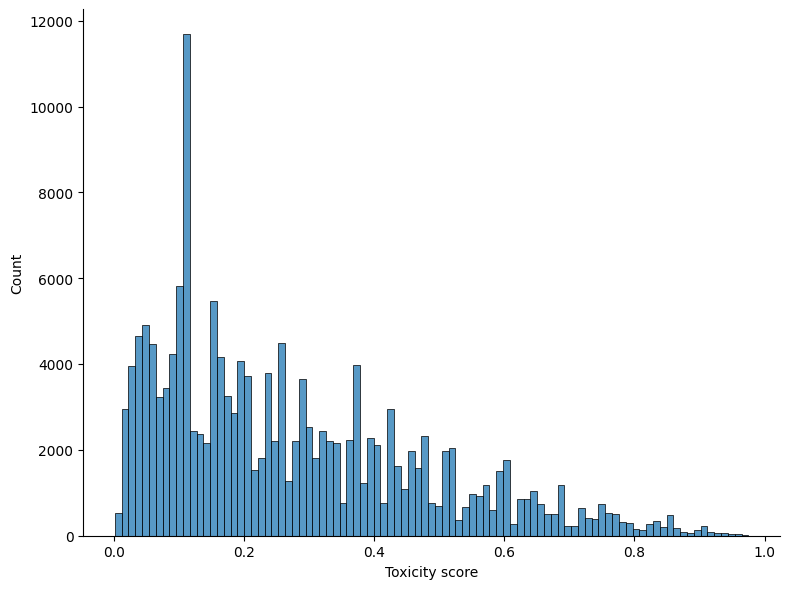

In [7]:
sns.displot(user_texts_no_2core, x='toxicity_score', height=6, aspect=8/6)
plt.xlabel('toxicity'.title() + ' score')
#plt.savefig(f"pic/toxicity[core=no_2core]{name_suffix}.png")

Text(0.5, 9.444444444444459, 'Compound score')

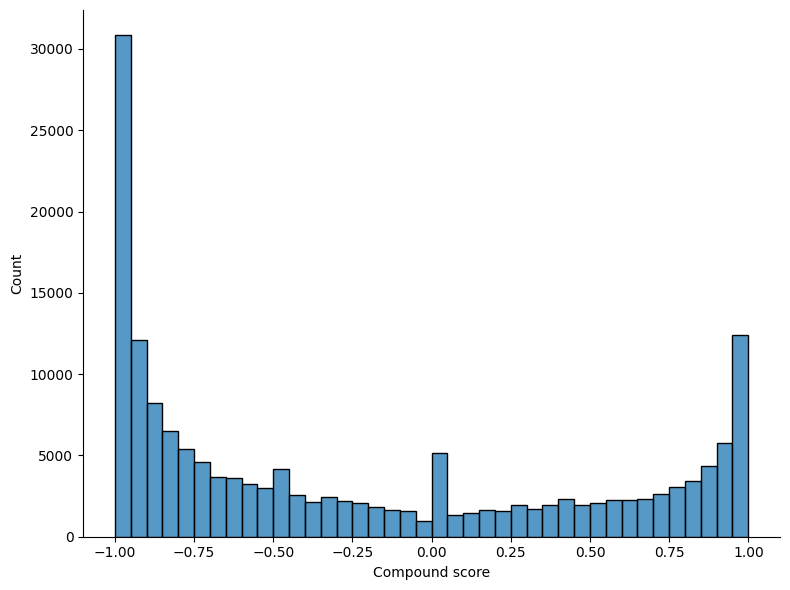

In [8]:

sns.displot(user_texts_no_2core, x='compound', height=6, aspect=8/6)
plt.xlabel('compound'.title() + ' score')
#plt.savefig(f"pic/compound[core=no_2core]{name_suffix}.png")

In [ ]:
## Calculate the ratio
toxici = user_texts_no_2core[(user_texts_no_2core['toxicity_score'] >= 0) & (user_texts_no_2core['toxicity_score'] <= 0.5)]
positive_count = toxici[(toxici['compound'] >= 0.25) & (toxici['compound'] <= 1)]
negative_count = toxici[(toxici['compound'] >= -1) & (toxici['compound'] <= -0.5)]

print(f"Number and proportion of positive users among 1-degree users.: {len(positive_count)}", 
      f"({100 * len(positive_count) / len(user_texts_no_2core)}%)")

print(f"Number and proportion of negative users among 1-degree users.: {len(negative_count)}", 
      f"({100 * len(negative_count) / len(user_texts_no_2core)}%)")

number of 1-degree users中便积极用户数量与占比: 46176 (28.069663536062734%)
number of 1-degree users中便消极用户数量与占比: 63281 (38.46752378347163%)


In [ ]:
fig, xs, ys, zs = toxi_senti_heatmap_2d_ver4(
                        user_texts_no_2core, 
                        zlim=(0, 1), 
                        z_scaling=True, 
                        density_mul_count=False
                    )
fig.show()
'''
pio.write_image(
    fig, 
    f'pic/z_scaled_heatmap[dim=2][core=no_2core][xy=compound&toxicity]{name_suffix}.png', 
    scale=5
)
'''
# # Find the high-density points
hd_non_2core = findHighDensityPoints(user_texts_no_2core, dict(x=xs, y=ys, z=zs))
#hd_non_2core.to_csv(f"data/high_density_users[core=non2core]{name_suffix}.csv")

INFO: Pandarallel will run on 20 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.
高密度点的数量: 13434, 在此类用户中的占比：8.166317133217836


## 3.5 Two types of emotion labels are drawn by users

In [5]:
user_texts1 = pd.read_csv("../R_POTUS2020/data/user_texts[party][POTUS2020][reddit][8.30].csv")
user_texts1.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172895 entries, 0 to 172894
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   author          172895 non-null  object 
 1   text            172895 non-null  object 
 2   neg             172895 non-null  float64
 3   neu             172895 non-null  float64
 4   pos             172895 non-null  float64
 5   compound        172895 non-null  float64
 6   toxicity_score  170902 non-null  float64
 7   party           55208 non-null   float64
 8   classification  172895 non-null  int64  
 9   probabilities   172895 non-null  object 
dtypes: float64(6), int64(1), object(3)
memory usage: 13.2+ MB


In [ ]:

# Match party labels
party_dict = user_texts1.set_index('author')['classification'].to_dict()
user_texts = user_texts.drop(columns='party')
user_texts['party'] = user_texts['author'].map(party_dict)
user_texts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172910 entries, 0 to 172909
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   author          172910 non-null  object 
 1   text            172895 non-null  object 
 2   neg             172910 non-null  float64
 3   neu             172910 non-null  float64
 4   pos             172910 non-null  float64
 5   compound        172910 non-null  float64
 6   toxicity_score  170902 non-null  float64
 7   party           172895 non-null  float64
dtypes: float64(6), object(2)
memory usage: 10.6+ MB


### seaborn

In [7]:
filtered_user_texts = user_texts[user_texts['party'].isin([0, 2])]

In [8]:
filtered_user_texts.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 152446 entries, 0 to 172909
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   author          152446 non-null  object 
 1   text            152446 non-null  object 
 2   neg             152446 non-null  float64
 3   neu             152446 non-null  float64
 4   pos             152446 non-null  float64
 5   compound        152446 non-null  float64
 6   toxicity_score  151135 non-null  float64
 7   party           152446 non-null  float64
dtypes: float64(6), object(2)
memory usage: 10.5+ MB


In [ ]:

party_counts = filtered_user_texts['party'].value_counts()
print(party_counts)

2.0    86068
0.0    66378
Name: party, dtype: int64


In [ ]:

def assign_party_color(row):   
    
    if row['party'] == 0:  
        return 'Democrats'
    else:
        return 'Republicans'

df_user = filtered_user_texts
df_user['rt party color'] = df_user.apply(assign_party_color, axis=1)

In [12]:
df_user.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 152446 entries, 0 to 172909
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   author          152446 non-null  object 
 1   text            152446 non-null  object 
 2   neg             152446 non-null  float64
 3   neu             152446 non-null  float64
 4   pos             152446 non-null  float64
 5   compound        152446 non-null  float64
 6   toxicity_score  151135 non-null  float64
 7   party           152446 non-null  float64
 8   rt party color  152446 non-null  object 
dtypes: float64(6), object(3)
memory usage: 11.6+ MB


In [ ]:
from scipy.stats import pearsonr
import numpy as np

color_map = {'Democrats': '#0000FF', 'Republicans': '#EE0000'}
results = {}

for i, party in enumerate(color_map.keys()):  
    party_df = df_user[df_user['rt party color'] == party]
    party_df = party_df.replace([np.inf, -np.inf], np.nan).dropna(subset=['toxicity_score', 'compound'])
    
    
    correlation, p_value = pearsonr(party_df['toxicity_score'], party_df['compound'])
    
  
    results[party] = {'Correlation': correlation, 'P-value': p_value}


for party, stats in results.items():
    print(f"{party}: Pearson Correlation Coefficient = {stats['Correlation']}, P-value = {stats['P-value']}")



Democrats: Pearson Correlation Coefficient = -0.26484994894219166, P-value = 0.0
Republicans: Pearson Correlation Coefficient = -0.25552701358332475, P-value = 0.0


## 3.6 Multimodal distribution detection

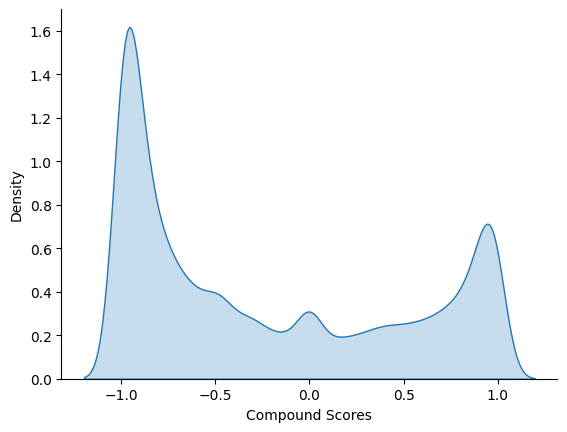

In [ ]:
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.neighbors import KernelDensity

data = user_texts_no_2core

compound_scores = data['compound'].values  

toxicity_scores = data['toxicity_score'].values


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

sns.kdeplot(compound_scores, fill=True)
#plt.title('Kernel Density Estimate of Compound Scores')
plt.xlabel('Compound Scores')
plt.ylabel('Density')
plt.savefig('pic/Kernel Density Estimate of Compound Scores', dpi = 300)
plt.show()


In [ ]:
from diptest import diptest
# Hartigan's Dip Test
dip_statistic, p_value = diptest(compound_scores)


print(f'Hartigan\'s Dip Test Statistic: {dip_statistic}')
print(f'P-value: {p_value}')


alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: Evidence of multimodality.")
else:
    print("Fail to reject the null hypothesis: No evidence of multimodality.")

Hartigan's Dip Test Statistic: 0.04694359925569227
P-value: 0.0
Reject the null hypothesis: Evidence of multimodality.


In [ ]:
from diptest import diptest
# Hartigan's Dip Test
dip_statistic, p_value = diptest(toxicity_scores)


print(f'Hartigan\'s Dip Test Statistic: {dip_statistic}')
print(f'P-value: {p_value}')


alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: Evidence of multimodality.")
else:
    print("Fail to reject the null hypothesis: No evidence of multimodality.")

Hartigan's Dip Test Statistic: 0.013241407957022642
P-value: 0.0
Reject the null hypothesis: Evidence of multimodality.


### 2 core users

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from scipy.signal import find_peaks


data = user_texts_2core

toxicity_scores = data['toxicity_score'].dropna().values
compound_scores = data['compound'].dropna().values


In [ ]:
from diptest import diptest
# Hartigan's Dip Test
dip_statistic, p_value = diptest(compound_scores)


print(f'Hartigan\'s Dip Test Statistic: {dip_statistic}')
print(f'P-value: {p_value}')


alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: Evidence of multimodality.")
else:
    print("Fail to reject the null hypothesis: No evidence of multimodality.")

Hartigan's Dip Test Statistic: 0.06823925200756925
P-value: 0.0
Reject the null hypothesis: Evidence of multimodality.


In [ ]:
# Hartigan's Dip Test
dip_statistic, p_value = diptest(toxicity_scores)
print(f'Hartigan\'s Dip Test Statistic: {dip_statistic}')
print(f'P-value: {p_value}')


alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: Evidence of multimodality.")
else:
    print("Fail to reject the null hypothesis: No evidence of multimodality.")

Hartigan's Dip Test Statistic: 0.018016080120027297
P-value: 0.0
Reject the null hypothesis: Evidence of multimodality.


### 1 degree

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from scipy.signal import find_peaks


data = user_texts_no_2core


toxicity_scores = data['toxicity_score'].dropna().values
compound_scores = data['compound'].dropna().values


In [ ]:
from diptest import diptest
# Hartigan's Dip Test
dip_statistic, p_value = diptest(compound_scores)

print(f'Hartigan\'s Dip Test Statistic: {dip_statistic}')
print(f'P-value: {p_value}')


alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: Evidence of multimodality.")
else:
    print("Fail to reject the null hypothesis: No evidence of multimodality.")

Hartigan's Dip Test Statistic: 0.04694359925569227
P-value: 0.0
Reject the null hypothesis: Evidence of multimodality.


In [ ]:
# Hartigan's Dip Test
dip_statistic, p_value = diptest(toxicity_scores)


print(f'Hartigan\'s Dip Test Statistic: {dip_statistic}')
print(f'P-value: {p_value}')


alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: Evidence of multimodality.")
else:
    print("Fail to reject the null hypothesis: No evidence of multimodality.")

Hartigan's Dip Test Statistic: 0.013241407957022642
P-value: 0.0
Reject the null hypothesis: Evidence of multimodality.


# 4.dpi adjust

In [9]:
from PIL import Image
import os

def set_dpi_for_all_image(directory, dpi):
    for root, dirs, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            img = Image.open(file_path)
            img.save(file_path, dpi=(dpi, dpi))

set_dpi_for_all_image('pic', 300)